<a href="https://colab.research.google.com/github/RhiturajD/GAN-to-generate-handwritten-Bangla-alphabets/blob/main/GAN(p)5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random
import cv2
from PIL import Image
from tensorflow.keras.layers import (Dense, 
                                     BatchNormalization, 
                                     LeakyReLU, 
                                     Reshape, 
                                     Conv2DTranspose,
                                     Conv2D,
                                     Dropout,
                                     Flatten)
from keras.initializers import RandomNormal
from keras.optimizers import Adam
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers.core import Activation
from keras.layers import UpSampling2D
from keras.layers import Input
from keras.models import Model

In [4]:
data = pd.read_csv("/content/drive/MyDrive/assamesealphabets.csv").astype('float32')
data.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,label
0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,...,0.0,0.0,1.0,5.0,1.0,65.0,253.0,123.0,0.0,10.0
1,2.0,1.0,36.0,14.0,0.0,2.0,0.0,1.0,0.0,0.0,...,2.0,152.0,245.0,20.0,0.0,3.0,0.0,0.0,0.0,10.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,1.0,4.0,0.0,145.0,59.0,0.0,2.0,0.0,10.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,10.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,5.0,0.0,...,102.0,248.0,167.0,1.0,3.0,0.0,0.0,0.0,0.0,10.0


In [5]:
width, height, channel = 28, 28, 1

In [6]:
X = data.iloc[:,1:].values
n_images=X.size//(28*28)
X = X[:n_images*28*28].reshape((n_images, width, height))
np.random.shuffle(X)
X.shape

(38193, 28, 28)

In [7]:
X = (X - 127.5) / 127.5

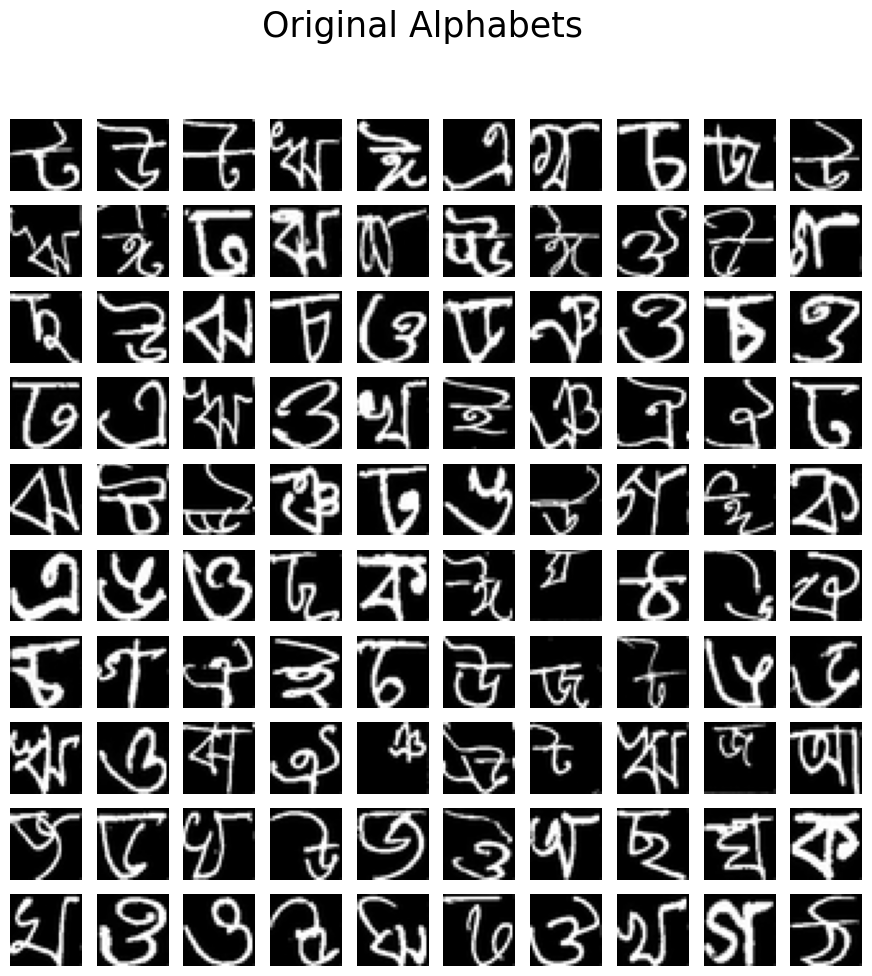

In [8]:
def show_data(X, title=""):
    plt.figure(figsize=(11,11))
    
    i = 1
    for img in X:
        plt.subplot(10, 10, i)
        plt.imshow(img.reshape((height, width)), cmap='gray')
        plt.axis('off')
        i+=1
        if i>100: break

    plt.suptitle(title, fontsize = 25)
    plt.show()
    
show_data(X, title="Original Alphabets")

In [9]:
gen_optimizer = Adam(0.0001, 0.5)
disc_optimizer= Adam(0.0002, 0.5)
noise_dim = 100

In [10]:
def buildGenerator():
    model = Sequential()

    model.add(Dense(1024, input_dim=noise_dim))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    
    model.add(Dense(6272, input_dim=noise_dim))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    
    model.add(Reshape((7, 7, 128)))
    
    model.add(UpSampling2D((2, 2)))
    model.add(Conv2D(64, (2, 2), padding='same', 
                     kernel_initializer=RandomNormal(0, 0.02)))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(0.2))
    
    model.add(UpSampling2D((2, 2)))
    model.add(Conv2D(64,(3,3),padding='same',
                    kernel_initializer=RandomNormal(0,0.02)))
    model.add(BatchNormalization())
    model.add(LeakyReLU(0.2))

   
    model.add(Conv2D(channel, (3, 3), padding='same', activation = "tanh", 
                     kernel_initializer=RandomNormal(0, 0.02)))
    
    return model

In [11]:
generator = buildGenerator()
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              103424    
                                                                 
 batch_normalization (BatchN  (None, 1024)             4096      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 6272)              6428800   
                                                                 
 batch_normalization_1 (Batc  (None, 6272)             25088     
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 6272)              0

In [12]:
def buildDiscriminator():
    model = Sequential()
    
    model.add(Conv2D(64, (5, 5), strides=2, padding='same', 
                     kernel_initializer=RandomNormal(0, 0.02), 
                     input_shape=(width, height, channel)))
    model.add(LeakyReLU(0.2))
    
    model.add(Conv2D(128, (5, 5), strides=2, 
                     kernel_initializer=RandomNormal(0, 0.02)))
    model.add(LeakyReLU(0.2))
    
    model.add(Flatten())
    
    model.add(Dense(256))
    model.add(LeakyReLU(0.2))
    
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))
    
    model.compile(loss='binary_crossentropy', optimizer=disc_optimizer)
    return model

In [13]:
discriminator = buildDiscriminator()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 14, 14, 64)        1664      
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 14, 14, 64)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 5, 5, 128)         204928    
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 5, 5, 128)         0         
                                                                 
 flatten (Flatten)           (None, 3200)              0         
                                                                 
 dense_2 (Dense)             (None, 256)               819456    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 256)              

In [14]:
noise = Input(shape=(noise_dim,))
fake_data = generator(noise)
discriminator.trainable = False
output = discriminator(fake_data)
gan = Model(noise, output)
gan.compile(loss='binary_crossentropy', optimizer=gen_optimizer)

In [15]:

gan.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 sequential (Sequential)     (None, 28, 28, 1)         6632257   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 1026305   
                                                                 
Total params: 7,658,562
Trainable params: 6,617,409
Non-trainable params: 1,041,153
_________________________________________________________________


In [16]:
fixed_noise = np.random.normal(0, 1, size=(100, noise_dim))

In [17]:
def show_generated_alphabets(title, epoch):
    imgs = generator.predict(fixed_noise)
    imgs = 0.5 * imgs + 0.5
    plt.figure(figsize=(11,11))
    
    i = 1
    for img in imgs:
        plt.subplot(10, 10, i)
        plt.imshow(img.reshape((height,width)), cmap='gray')
        plt.axis('off')
        i+=1
    plt.suptitle(title, fontsize = 25)
    plt.savefig(str(epoch)+".png", transparent=True)
    plt.show()

In [18]:
epochs = 101
batch_size = 128
steps_per_epoch = 38193//batch_size

In [22]:
import tensorflow as tf
from tensorflow import keras
checkpoint_dir = 'checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(gen_optimizer=gen_optimizer,
                                  disc_optimizer=disc_optimizer,
                                  gan_opt=gen_optimizer,
                                  generator=buildGenerator(),
                                  discriminator=buildDiscriminator(),
                                  GAN = gan
                                  )

ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)
if ckpt_manager.latest_checkpoint:
  checkpoint.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

4/4 [==============================] - 0s 4ms/step
epoch:  0
discriminator loss:  0.551585853099823
generator loss:  1.5534884929656982
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step


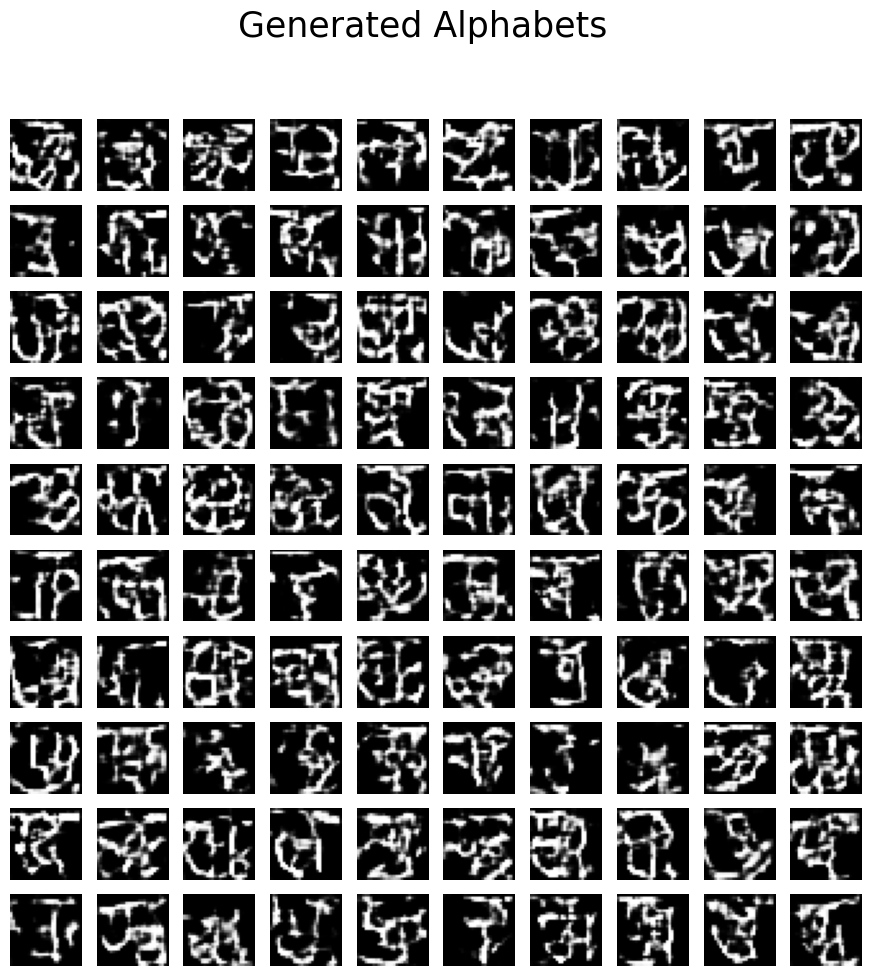

4/4 [==============================] - 0s 3ms/step
epoch:  1
discriminator loss:  0.6544010043144226
generator loss:  1.5676813125610352
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  2
discriminator loss:  0.544447660446167
generator loss:  1.2250796556472778
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  3
discriminator loss:  0.5901891589164734
generator loss:  1.7440588474273682
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  4
discriminator loss:  0.5696334838867188
generator loss:  1.5704574584960938
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  5
discriminator loss:  0.516323983669281
generator loss:  1.2110805511

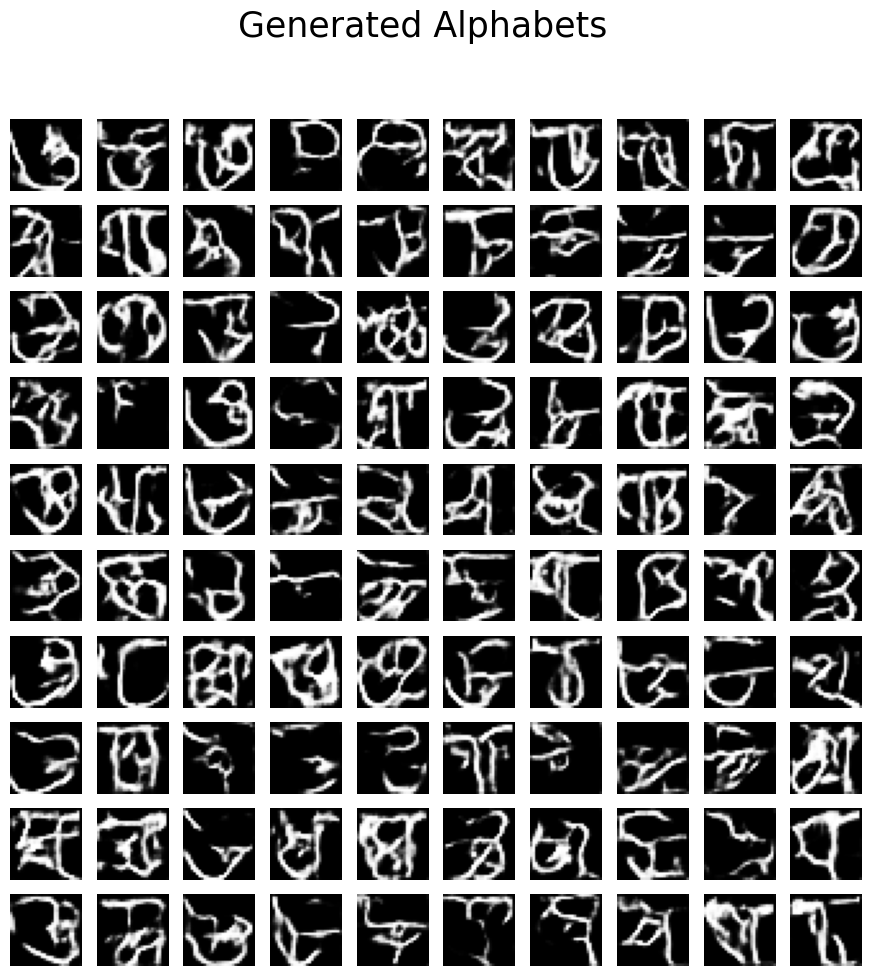

4/4 [==============================] - 0s 6ms/step
epoch:  6
discriminator loss:  0.5652750730514526
generator loss:  1.5632905960083008
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  7
discriminator loss:  0.5393032431602478
generator loss:  1.3405615091323853
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  8
discriminator loss:  0.5387713313102722
generator loss:  0.7996339201927185
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  9
discriminator loss:  0.5862424373626709
generator loss:  0.8087717294692993
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  10
discriminator loss:  0.5188987255096436
generator loss:  1.1795799

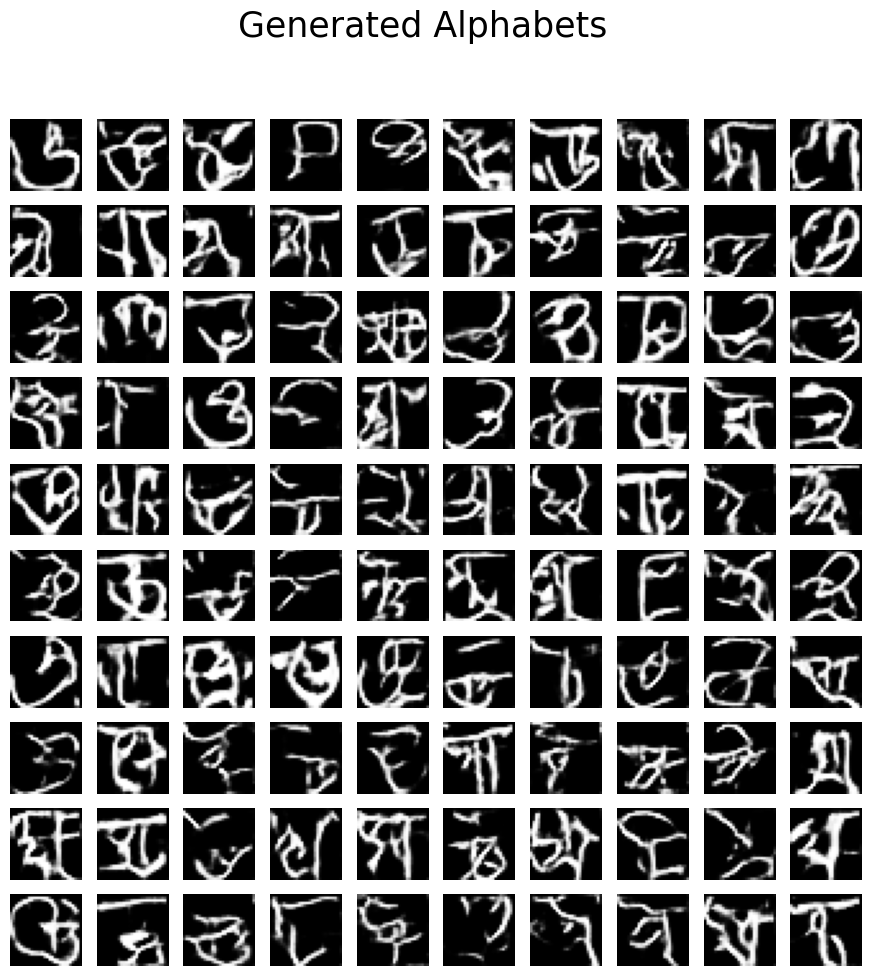

4/4 [==============================] - 0s 4ms/step
epoch:  11
discriminator loss:  0.5280134677886963
generator loss:  0.8010053634643555
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 7ms/step
epoch:  12
discriminator loss:  0.5358591079711914
generator loss:  1.5945014953613281
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  13
discriminator loss:  0.6283220648765564
generator loss:  0.5941628217697144
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  14
discriminator loss:  0.4959756135940552
generator loss:  1.4429843425750732
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  15
discriminator loss:  0.5342736840248108
generator loss:  0.928

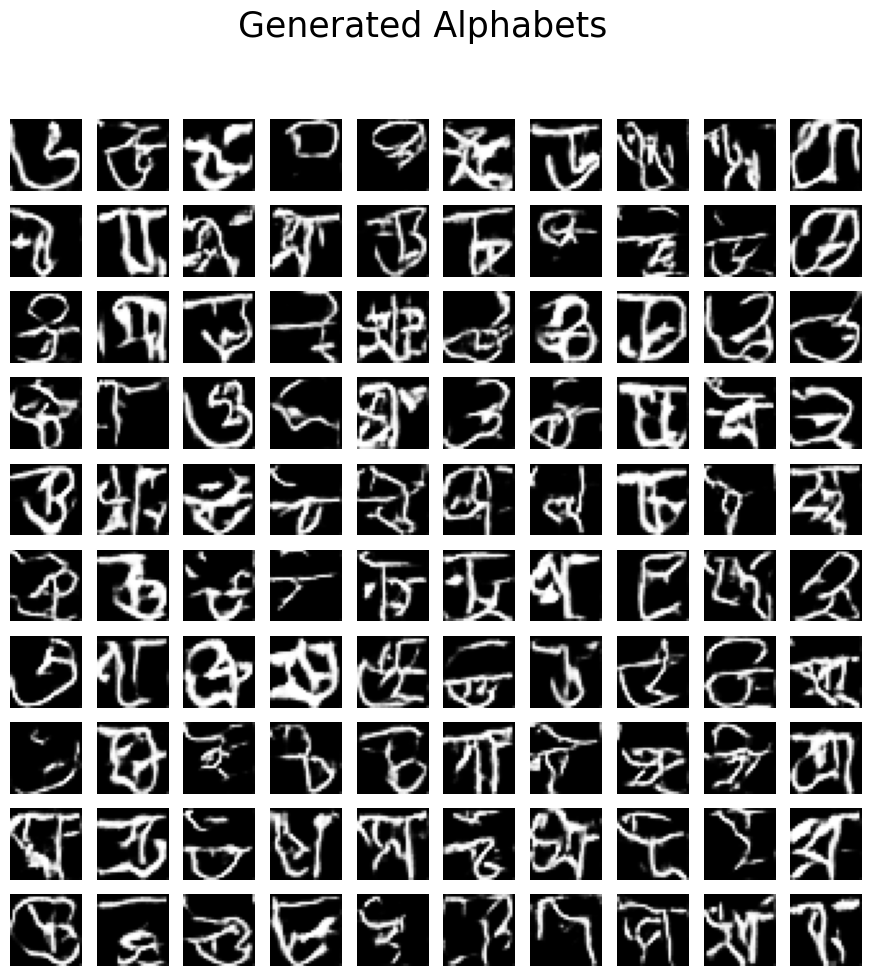

4/4 [==============================] - 0s 3ms/step
epoch:  16
discriminator loss:  0.51976078748703
generator loss:  1.2348241806030273
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  17
discriminator loss:  0.486742228269577
generator loss:  1.6253116130828857
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  18
discriminator loss:  0.5180690884590149
generator loss:  1.7519516944885254
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  19
discriminator loss:  0.6028990745544434
generator loss:  0.6293706893920898
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  20
discriminator loss:  0.49644166231155396
generator loss:  1.58970

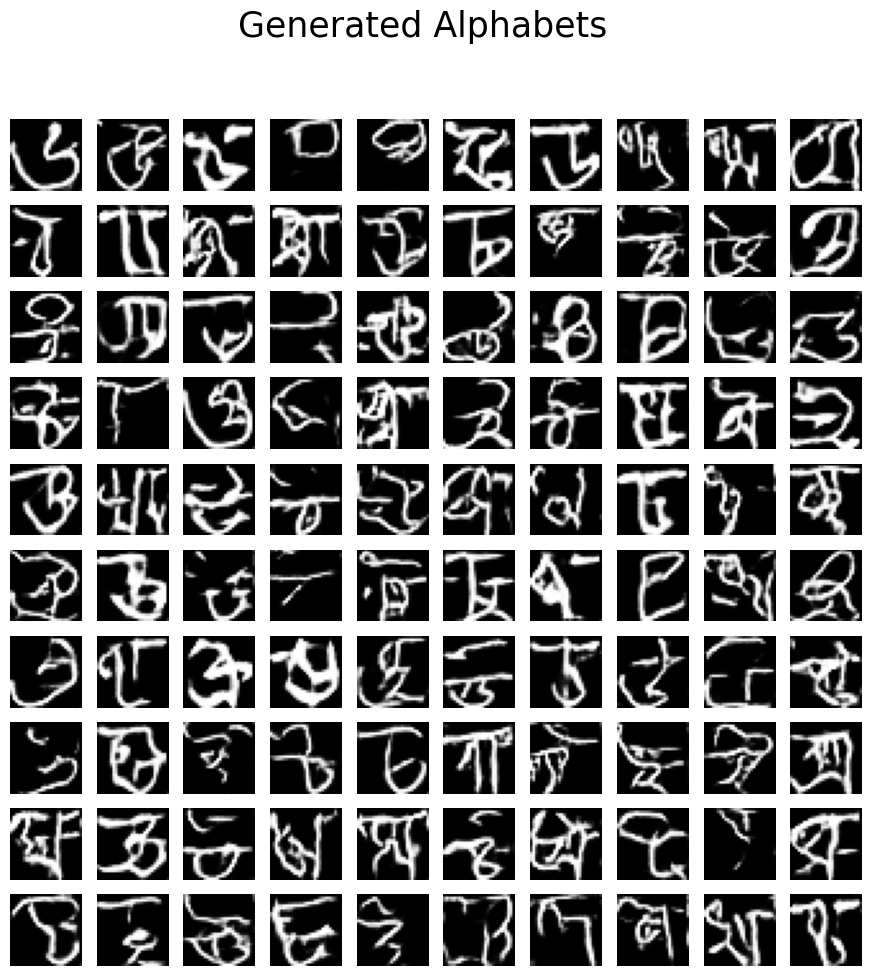

4/4 [==============================] - 0s 8ms/step
epoch:  21
discriminator loss:  0.4815453290939331
generator loss:  1.2686058282852173
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  22
discriminator loss:  0.4734848141670227
generator loss:  1.7986292839050293
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  23
discriminator loss:  0.4628702402114868
generator loss:  1.8350706100463867
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 6ms/step
epoch:  24
discriminator loss:  0.5047252774238586
generator loss:  1.2490241527557373
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 6ms/step
epoch:  25
discriminator loss:  0.5352669954299927
generator loss:  1.058

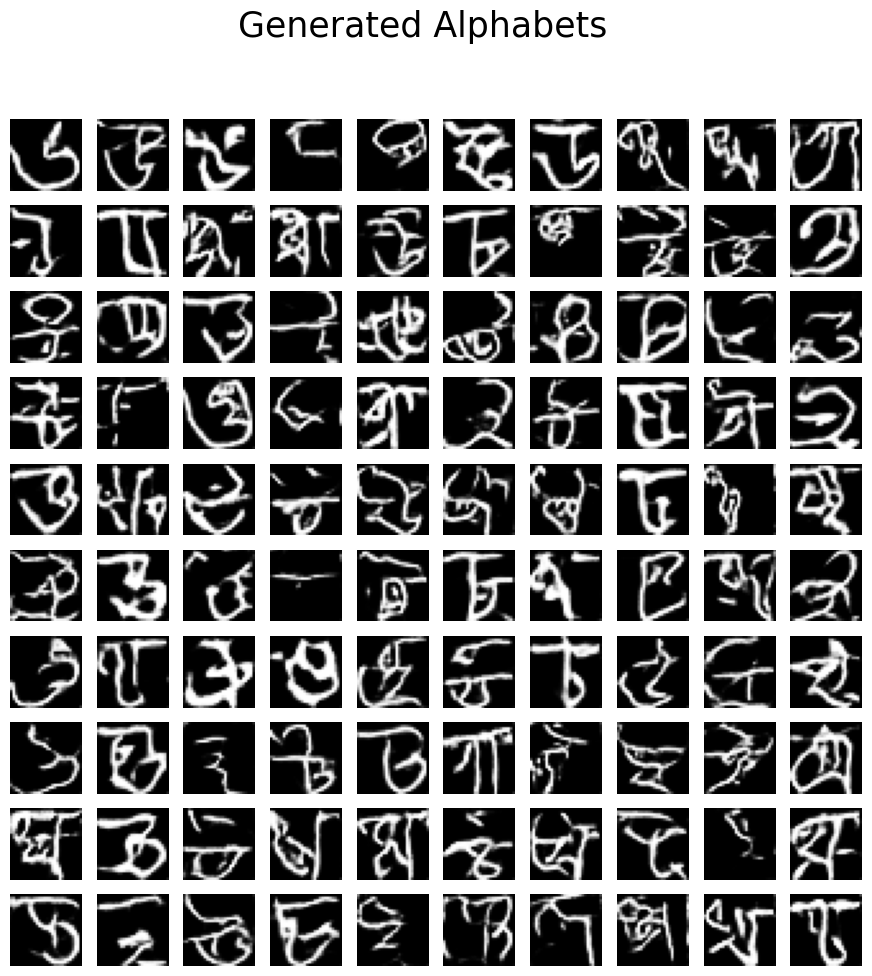

4/4 [==============================] - 0s 3ms/step
epoch:  26
discriminator loss:  0.48483967781066895
generator loss:  1.3338332176208496
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  27
discriminator loss:  0.45937037467956543
generator loss:  1.5698539018630981
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  28
discriminator loss:  0.4783400297164917
generator loss:  1.4556260108947754
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 7ms/step
epoch:  29
discriminator loss:  0.48332875967025757
generator loss:  1.6653099060058594
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  30
discriminator loss:  0.4917847216129303
generator loss:  1.

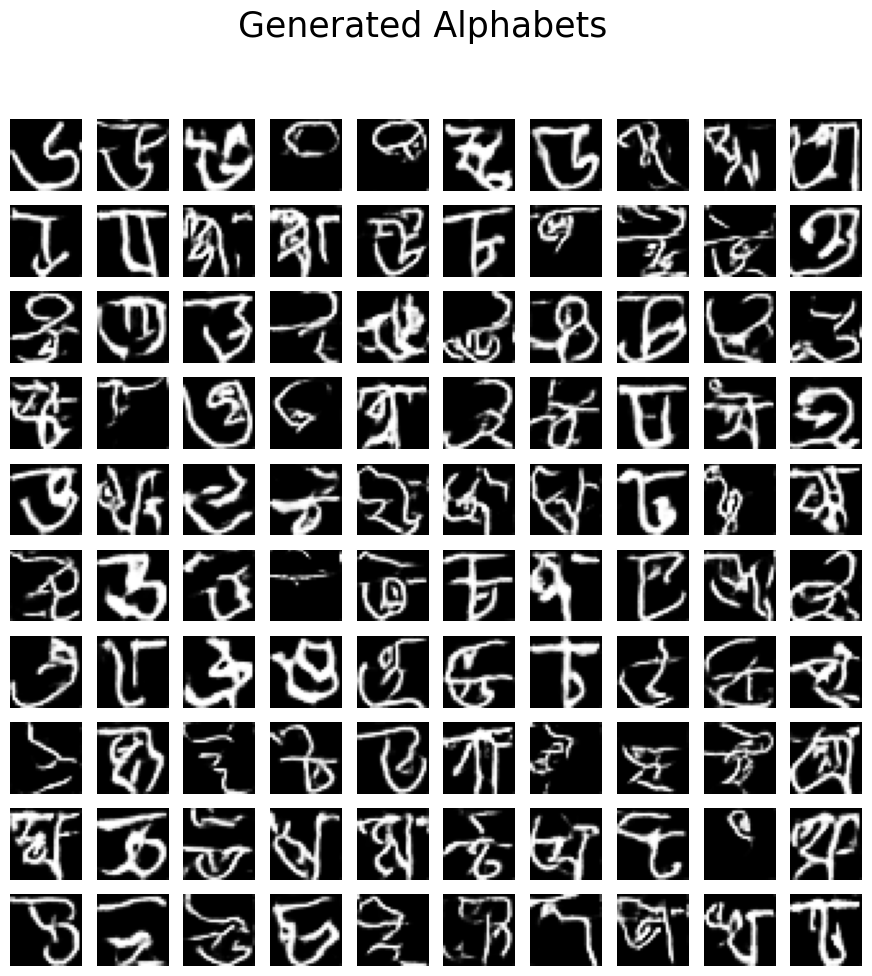

4/4 [==============================] - 0s 4ms/step
epoch:  31
discriminator loss:  0.5338504314422607
generator loss:  1.0436781644821167
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  32
discriminator loss:  0.48558366298675537
generator loss:  1.4951133728027344
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 6ms/step
epoch:  33
discriminator loss:  0.4685485363006592
generator loss:  1.630411148071289
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  34
discriminator loss:  0.4721885025501251
generator loss:  1.3334171772003174
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  35
discriminator loss:  0.49171894788742065
generator loss:  1.81

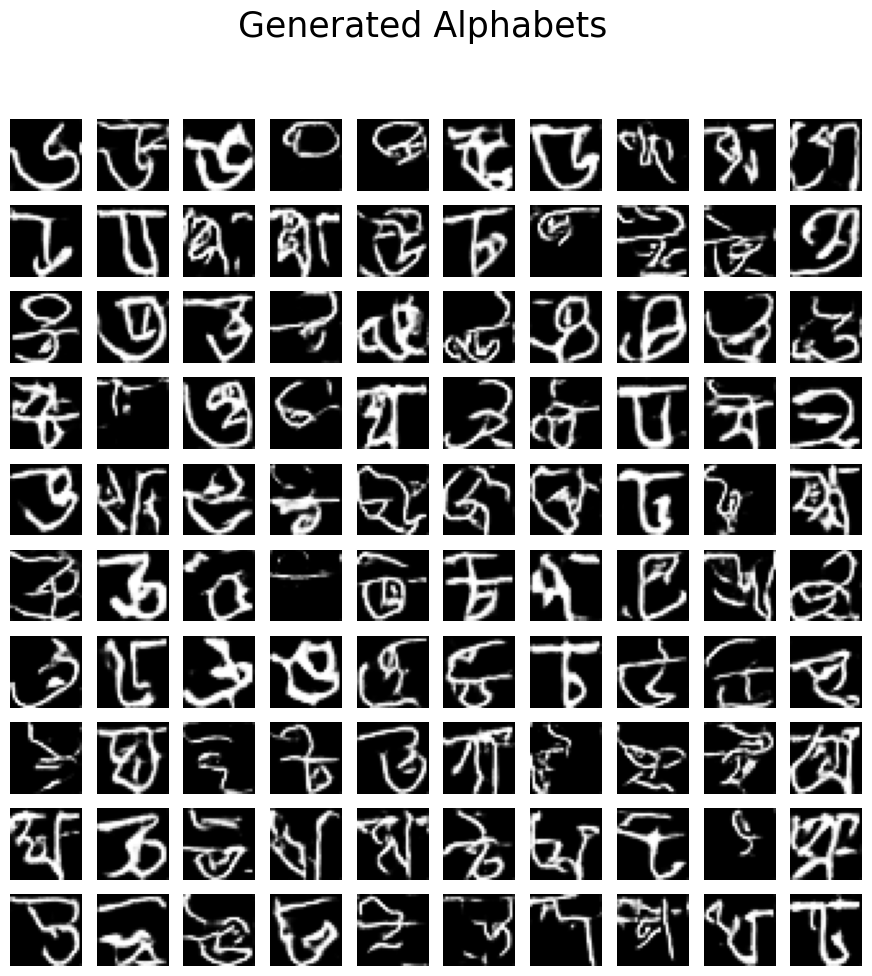

4/4 [==============================] - 0s 5ms/step
epoch:  36
discriminator loss:  0.5115208029747009
generator loss:  1.282543420791626
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  37
discriminator loss:  0.4844994843006134
generator loss:  1.5435699224472046
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  38
discriminator loss:  0.48805972933769226
generator loss:  1.6785387992858887
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 6ms/step
epoch:  39
discriminator loss:  0.47433900833129883
generator loss:  1.3465685844421387
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  40
discriminator loss:  0.55568528175354
generator loss:  2.1199

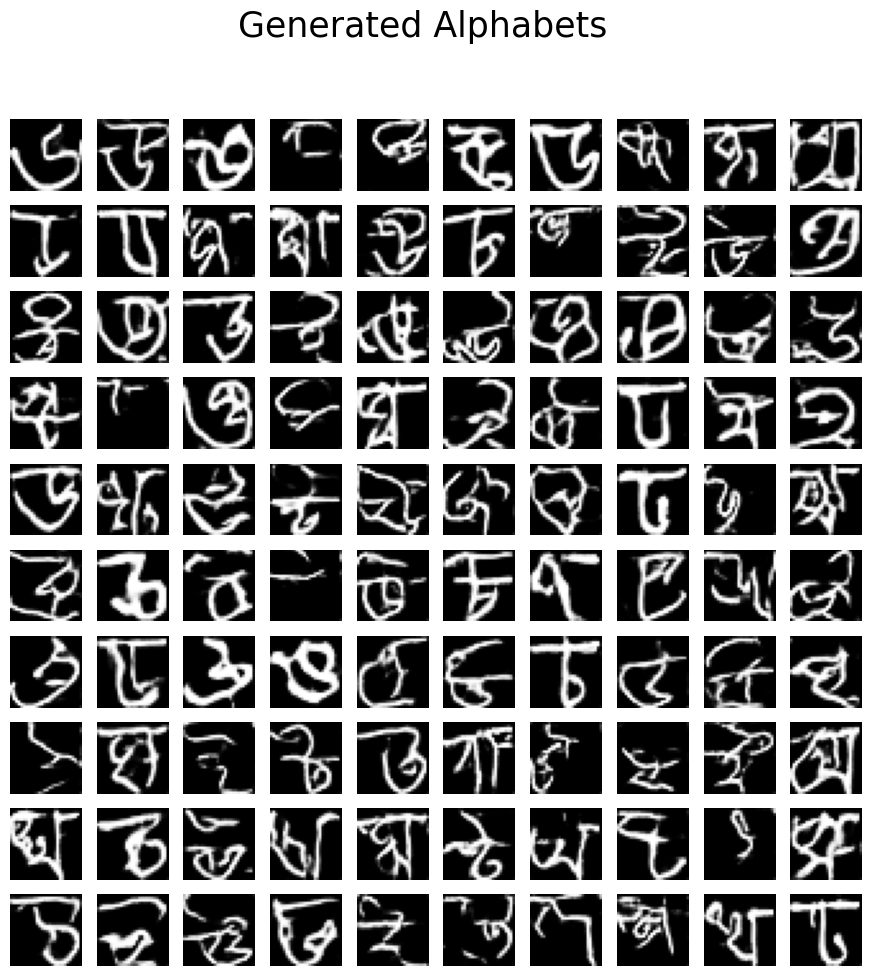

4/4 [==============================] - 0s 3ms/step
epoch:  41
discriminator loss:  0.4730152487754822
generator loss:  1.9744032621383667
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  42
discriminator loss:  0.5056578516960144
generator loss:  1.7799135446548462
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  43
discriminator loss:  0.49329209327697754
generator loss:  1.8347656726837158
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  44
discriminator loss:  0.49474814534187317
generator loss:  1.7578320503234863
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  45
discriminator loss:  0.48064154386520386
generator loss:  1.

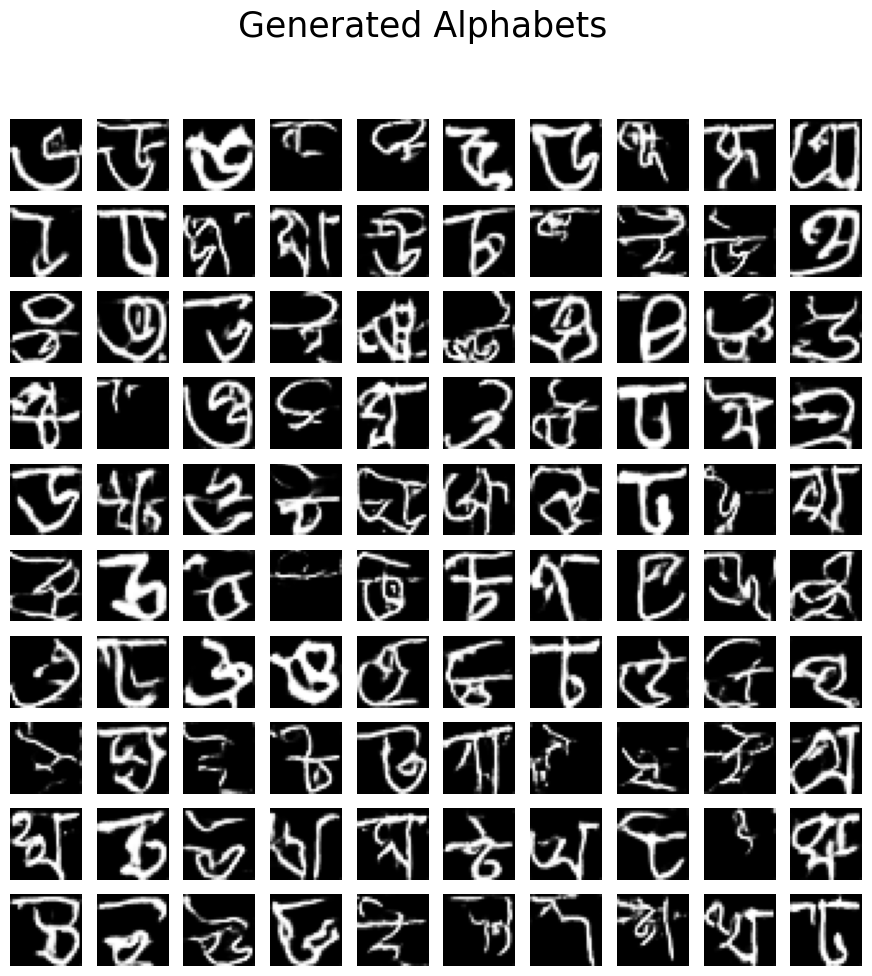

4/4 [==============================] - 0s 4ms/step
epoch:  46
discriminator loss:  0.44384485483169556
generator loss:  1.5896052122116089
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  47
discriminator loss:  0.6181747317314148
generator loss:  0.9029068350791931
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  48
discriminator loss:  0.4677828848361969
generator loss:  1.5326883792877197
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  49
discriminator loss:  0.5026997923851013
generator loss:  1.8684080839157104
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  50
discriminator loss:  0.4906461238861084
generator loss:  1.44

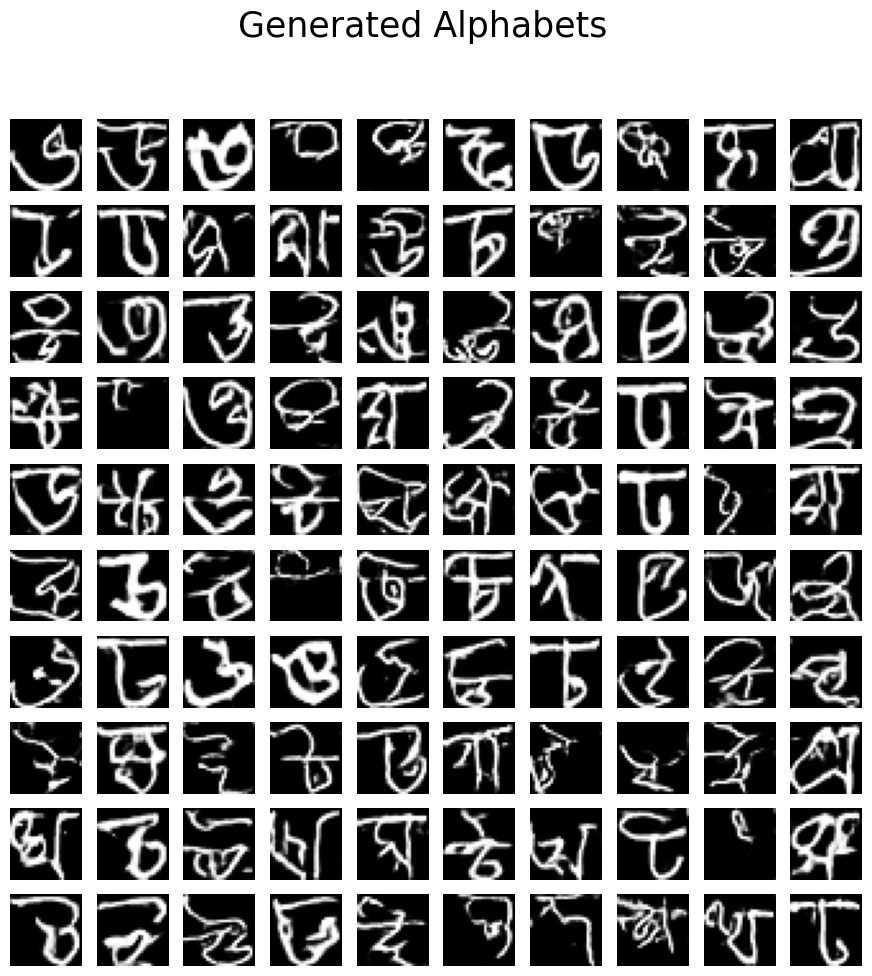

4/4 [==============================] - 0s 6ms/step
epoch:  51
discriminator loss:  0.4770461320877075
generator loss:  1.4951010942459106
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  52
discriminator loss:  0.48490095138549805
generator loss:  1.3847827911376953
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  53
discriminator loss:  0.4901336133480072
generator loss:  2.0910863876342773
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  54
discriminator loss:  0.47948262095451355
generator loss:  2.0075201988220215
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  55
discriminator loss:  0.4558902680873871
generator loss:  1.8

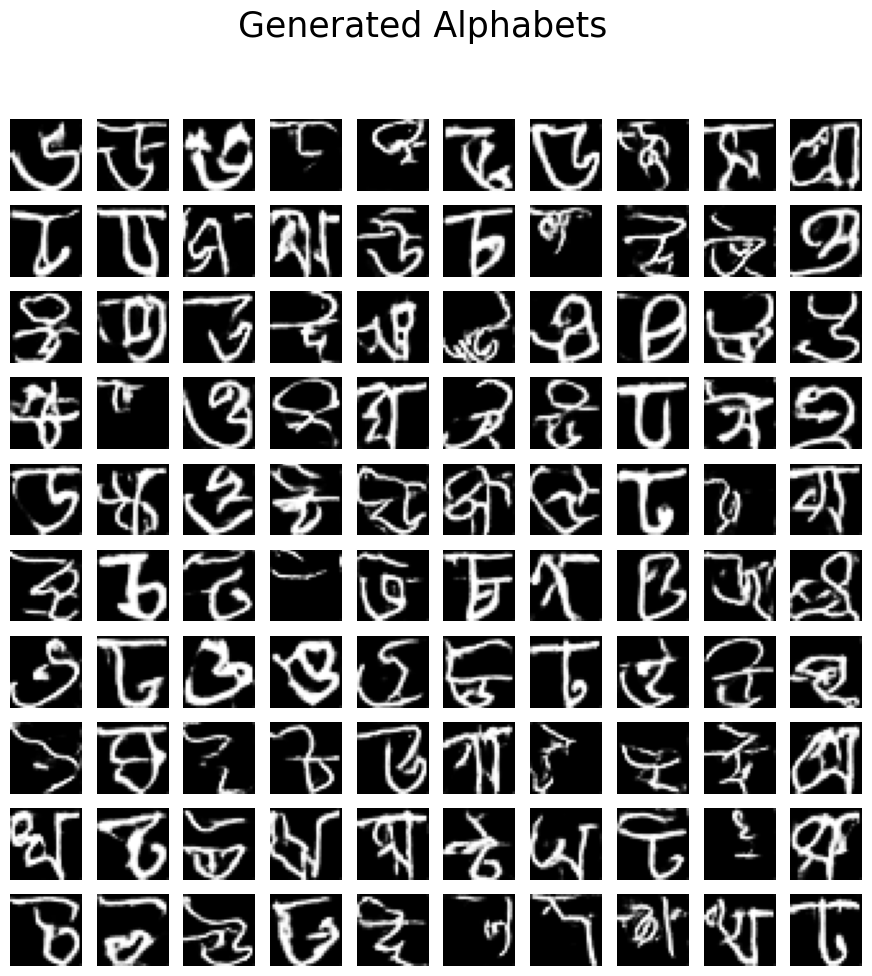

4/4 [==============================] - 0s 4ms/step
epoch:  56
discriminator loss:  0.46368229389190674
generator loss:  1.5244898796081543
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  57
discriminator loss:  0.4601476788520813
generator loss:  1.8147953748703003
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  58
discriminator loss:  0.4987388849258423
generator loss:  1.3614822626113892
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  59
discriminator loss:  0.49024027585983276
generator loss:  2.1111836433410645
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  60
discriminator loss:  0.4999609589576721
generator loss:  1.7

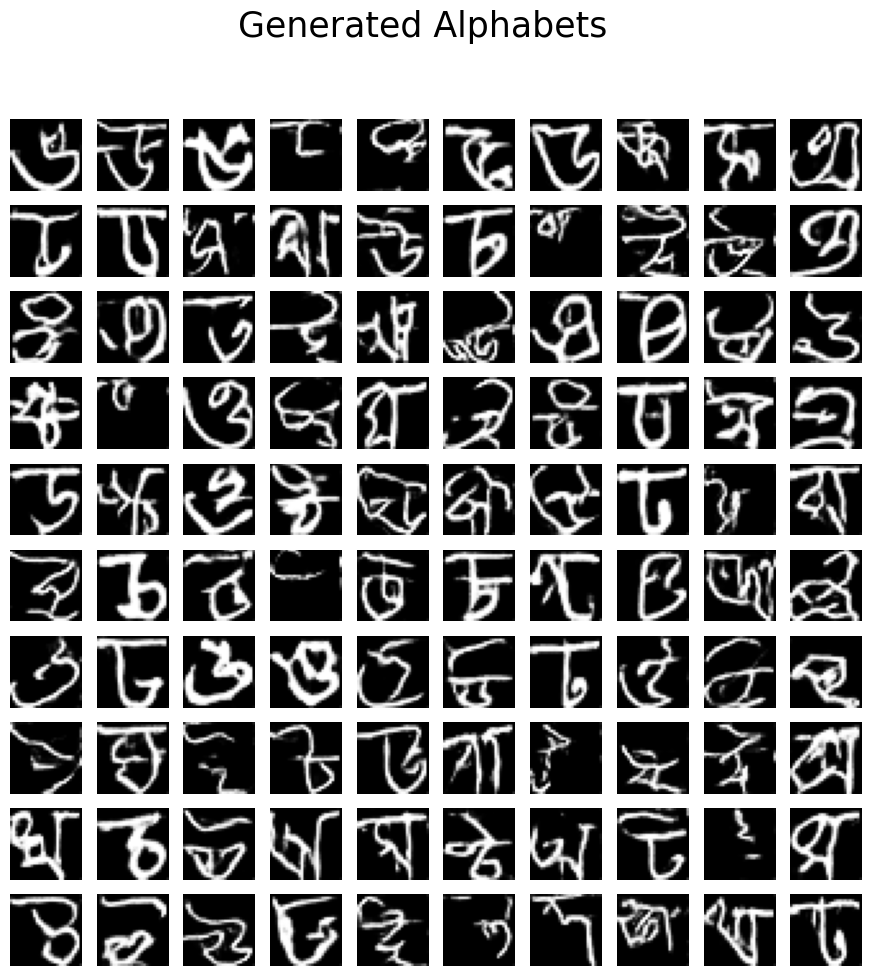

4/4 [==============================] - 0s 4ms/step
epoch:  61
discriminator loss:  0.4644281268119812
generator loss:  1.37430739402771
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  62
discriminator loss:  0.4787421226501465
generator loss:  1.2650659084320068
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  63
discriminator loss:  0.48378482460975647
generator loss:  1.184990406036377
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  64
discriminator loss:  0.4575996994972229
generator loss:  1.4355552196502686
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  65
discriminator loss:  0.4631844460964203
generator loss:  1.92127

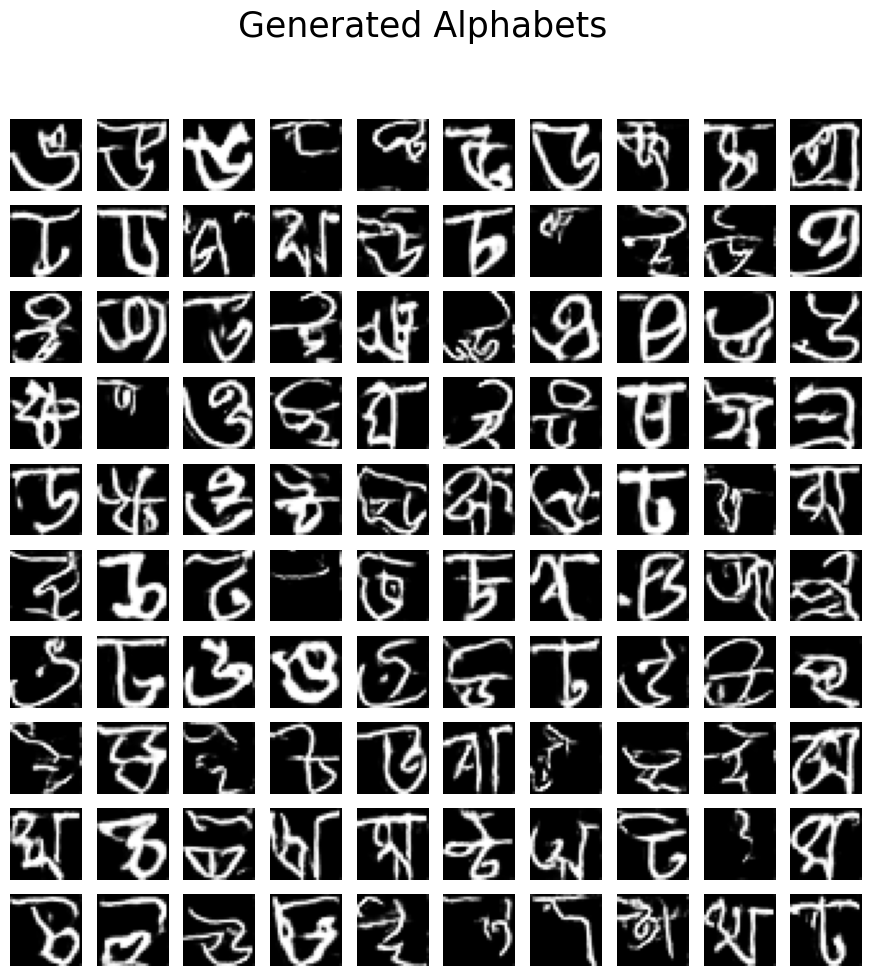

4/4 [==============================] - 0s 6ms/step
epoch:  66
discriminator loss:  0.48619940876960754
generator loss:  1.9850707054138184
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  67
discriminator loss:  0.4595133364200592
generator loss:  1.6198132038116455
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  68
discriminator loss:  0.5168923735618591
generator loss:  1.8256803750991821
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  69
discriminator loss:  0.4725664556026459
generator loss:  1.3535932302474976
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  70
discriminator loss:  0.4710344076156616
generator loss:  1.71

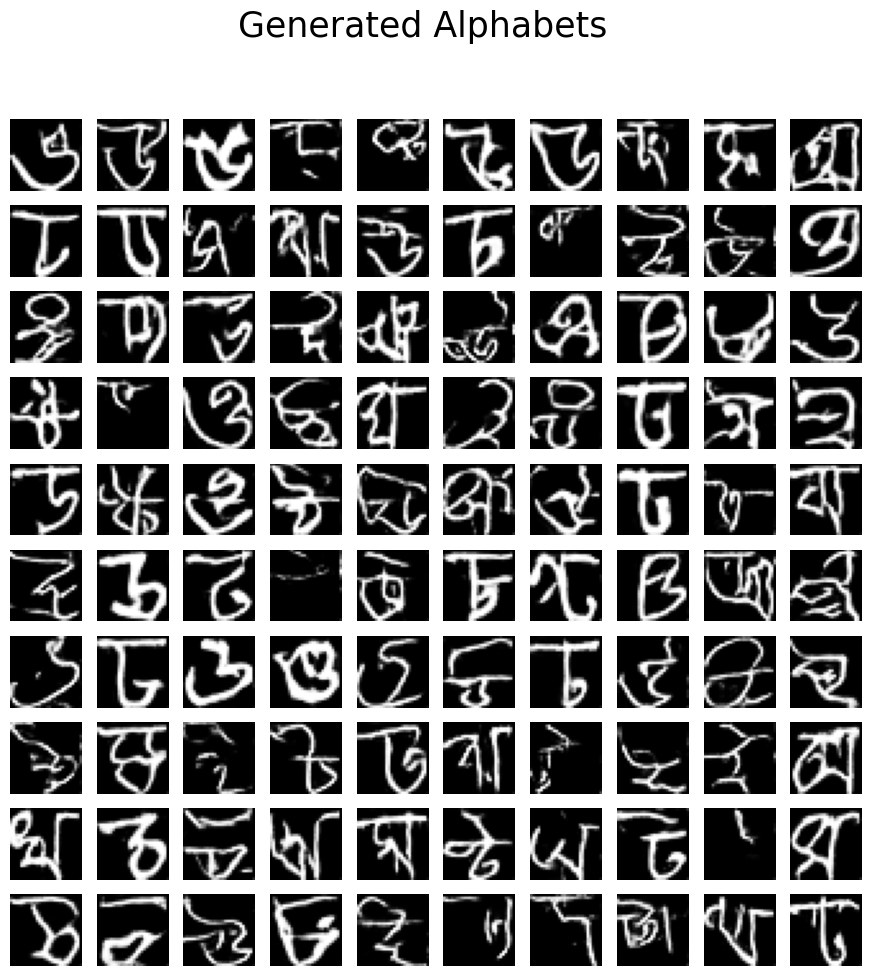

4/4 [==============================] - 0s 4ms/step
epoch:  71
discriminator loss:  0.4631081521511078
generator loss:  1.6047533750534058
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  72
discriminator loss:  0.5009661912918091
generator loss:  2.211700677871704
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  73
discriminator loss:  0.47676098346710205
generator loss:  1.6219099760055542
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  74
discriminator loss:  0.502059817314148
generator loss:  1.5922337770462036
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  75
discriminator loss:  0.482408732175827
generator loss:  2.04329

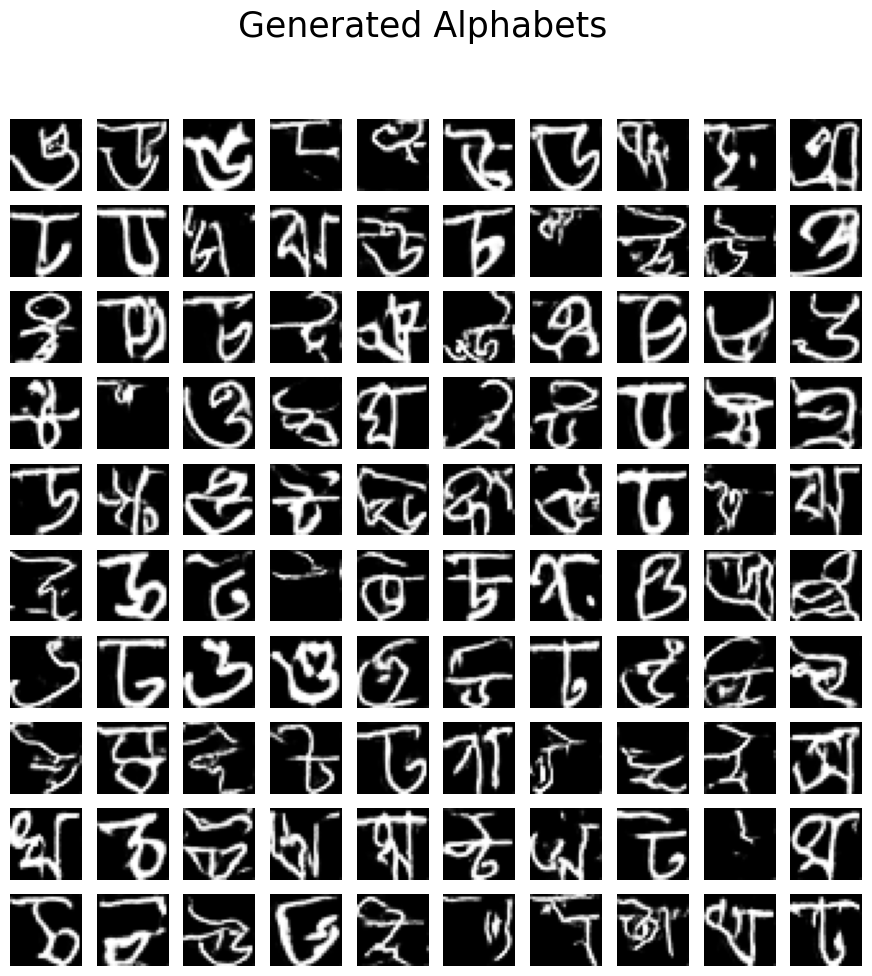

4/4 [==============================] - 0s 4ms/step
epoch:  76
discriminator loss:  0.4793074131011963
generator loss:  1.8563745021820068
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  77
discriminator loss:  0.4554305374622345
generator loss:  1.7197802066802979
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 6ms/step
epoch:  78
discriminator loss:  0.45741093158721924
generator loss:  1.5780494213104248
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  79
discriminator loss:  0.47498488426208496
generator loss:  1.8950599431991577
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  80
discriminator loss:  0.47551196813583374
generator loss:  2.

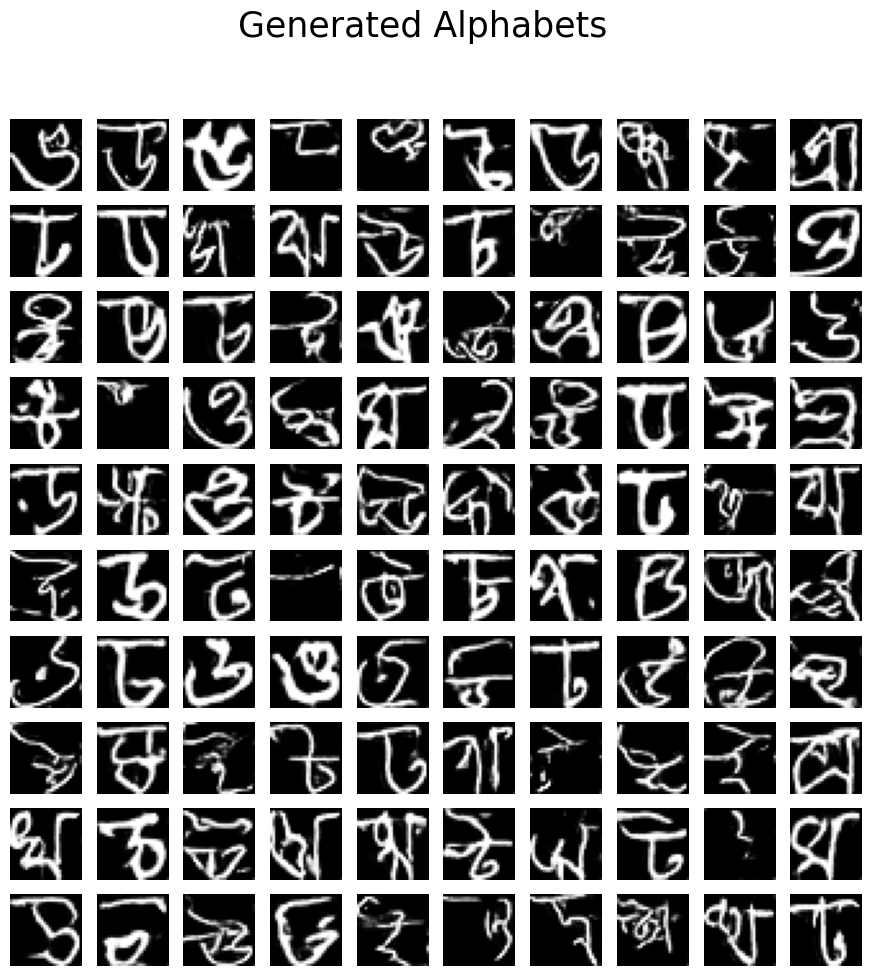

4/4 [==============================] - 0s 3ms/step
epoch:  81
discriminator loss:  0.5241823792457581
generator loss:  2.1747920513153076
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  82
discriminator loss:  0.4583965837955475
generator loss:  1.4901999235153198
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  83
discriminator loss:  0.47272989153862
generator loss:  1.6493602991104126
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  84
discriminator loss:  0.46803587675094604
generator loss:  1.483698844909668
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 8ms/step
epoch:  85
discriminator loss:  0.5337838530540466
generator loss:  1.17998

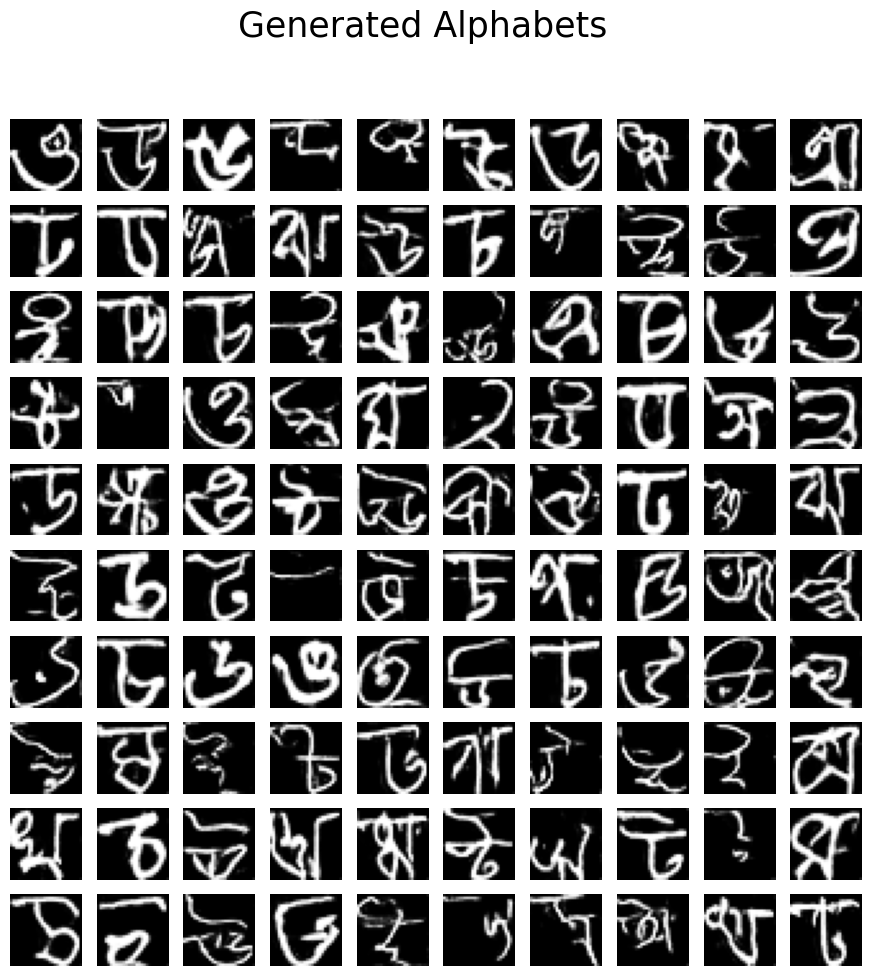

4/4 [==============================] - 0s 4ms/step
epoch:  86
discriminator loss:  0.46314600110054016
generator loss:  1.5926038026809692
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  87
discriminator loss:  0.4765993058681488
generator loss:  1.6975998878479004
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  88
discriminator loss:  0.45901280641555786
generator loss:  1.9899531602859497
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  89
discriminator loss:  0.48434188961982727
generator loss:  1.669074535369873
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  90
discriminator loss:  0.47349855303764343
generator loss:  1.

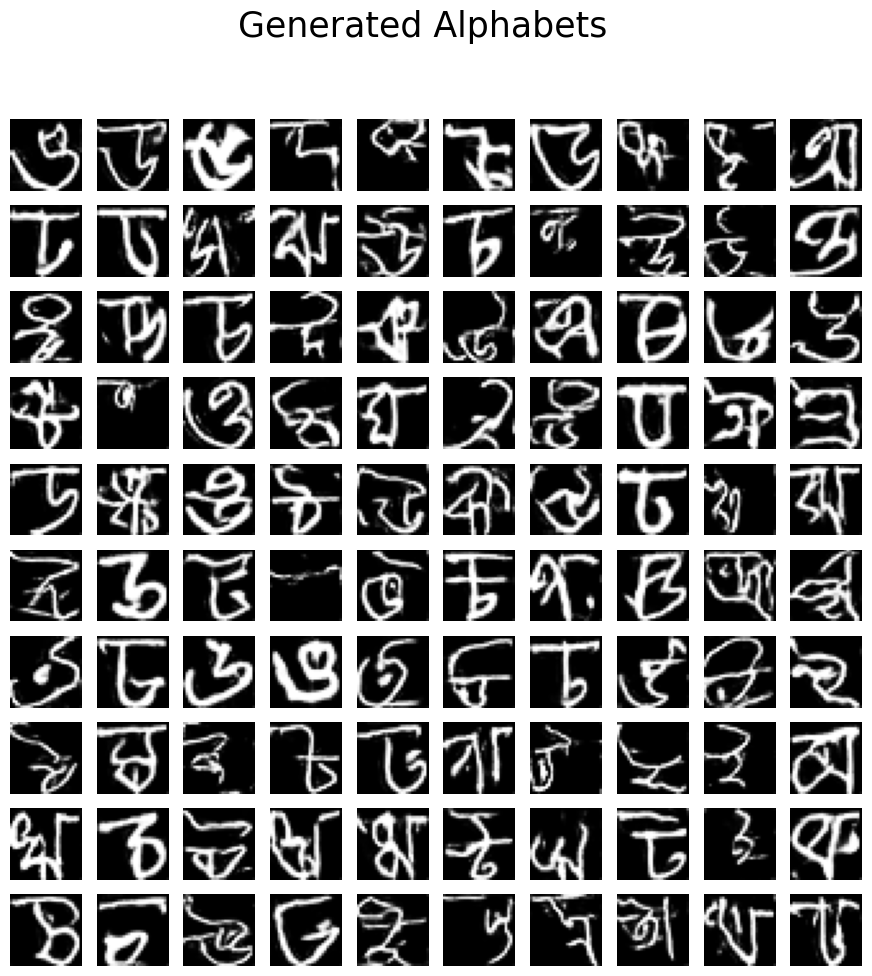

4/4 [==============================] - 0s 5ms/step
epoch:  91
discriminator loss:  0.47828495502471924
generator loss:  1.3277771472930908
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 7ms/step
epoch:  92
discriminator loss:  0.4626559615135193
generator loss:  1.6380910873413086
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 5ms/step
epoch:  93
discriminator loss:  0.437660813331604
generator loss:  1.6267435550689697
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 7ms/step
epoch:  94
discriminator loss:  0.4447038173675537
generator loss:  2.0227012634277344
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  95
discriminator loss:  0.5385118126869202
generator loss:  2.190

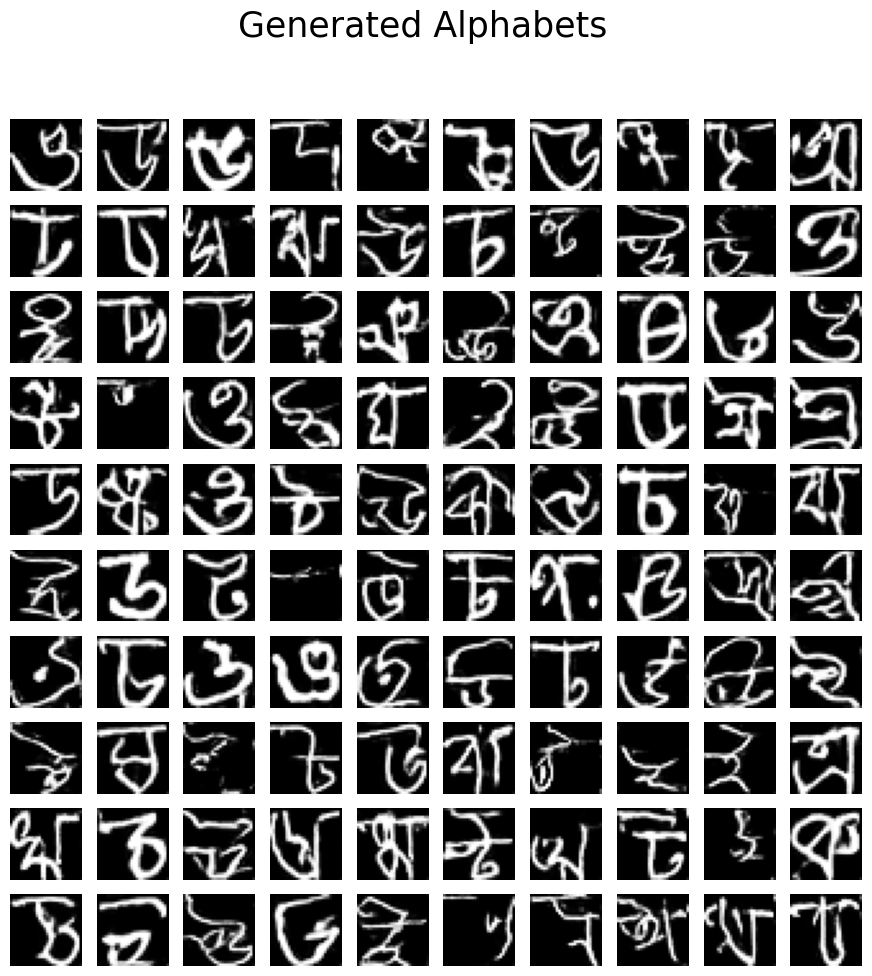

4/4 [==============================] - 0s 3ms/step
epoch:  96
discriminator loss:  0.5399726033210754
generator loss:  2.080327272415161
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  97
discriminator loss:  0.5123686194419861
generator loss:  1.8179600238800049
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  98
discriminator loss:  0.4857540726661682
generator loss:  1.8978192806243896
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 4ms/step
epoch:  99
discriminator loss:  0.4827019274234772
generator loss:  1.300558090209961
--------------------------------------------------------------------------------
4/4 [==============================] - 0s 3ms/step
epoch:  100
discriminator loss:  0.43330317735671997
generator loss:  1.638

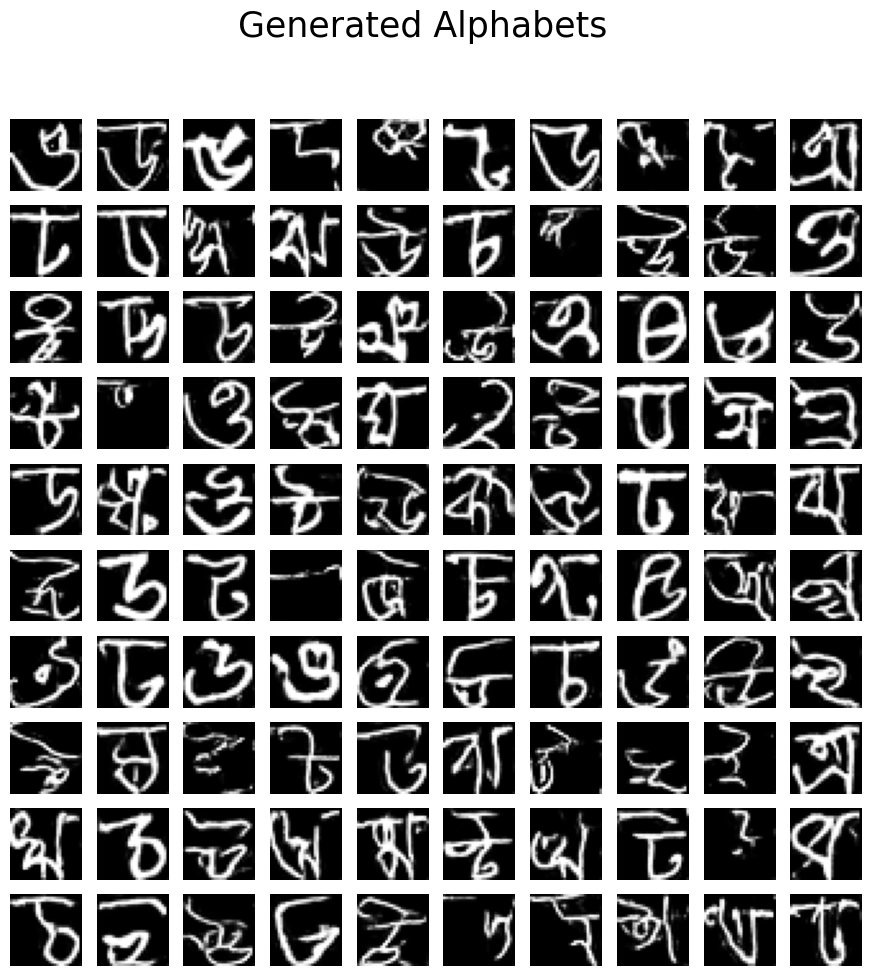

In [25]:
for epoch in range(epochs):
    for batch in range(steps_per_epoch):
        input_gen = np.random.normal(0, 1, size=(batch_size, noise_dim))
        fake_data = generator.predict(input_gen)
        
        real_data = X[np.random.randint(0, X.shape[0], size=batch_size)]
        real_data = real_data.reshape((batch_size, width, height, channel))
        
        input_disc = np.concatenate((real_data, fake_data))

        label_disc = np.zeros(2*batch_size)
        label_disc[:batch_size] = 0.9
        label_disc[batch_size:] = 0.1
        loss_disc = discriminator.train_on_batch(input_disc, label_disc)

        label_gen = np.ones(batch_size)
        loss_gen = gan.train_on_batch(input_gen, label_gen)

    print("epoch: ", epoch)
    print("discriminator loss: ", loss_disc)
    print("generator loss: ", loss_gen)
    print("-"*80)
    
    if epoch % 5 == 0:
        show_generated_alphabets("Generated Alphabets", epoch)
        ckpt_manager.save()